#### 1.1 Importing Data
#### 1.2 Creating Variables
#### 1.3 Calculating Speed and Remove Unreasonable Points
#### 2.1 Visualize The Movement
#### 3.1 Algorithm To Detect Dwells
- ##### 3.2.1 Home Point Detect 
- ##### 3.2.2 Check Unique Home Point
- ##### 3.2.2 Result Analysize
- ##### 3.2.1 Workspace Points Detect 
- ##### 3.2.1 Situations and Methods 
- ##### 3.3.2 Check Unique Workspace Points
#### 3.4 Analysis of Commuting Patterns
#### 3.5 Other Undefined Stay Points
#### 4.1 Further Thoughts

### 1.1 Importing Data
At the beginning of the project, I first imported some common packages used for geographical analysis.

In [80]:
import pandas as pd
import geopandas as gpd
import shapely as shp
import matplotlib.pyplot as plt
import contextily as cx
import warnings

from shapely.geometry import Point, MultiPoint
from geopy.distance import geodesic
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime, timedelta
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)
warnings.filterwarnings('ignore', '.*SettingWithCopyWarning.*')

### 1.2 Creating Variables
Simultaneously, I created several new variables such as `user_n` and `DD`, representing the user identification number and days numerically.

It's worth mentioning that the dataset was grouped and sorted by user identification number and GPS signal time, which facilitated subsequent analyses.

In [81]:
GPSdf = pd.read_csv('https://gps-london.s3.eu-west-2.amazonaws.com/gps.csv')
GPSdf.info
#generate a example dataset of first 10000rows data from original data set for further processing
df1 = GPSdf
#give each user a specific number
labels, unique = pd.factorize(df1['user_id'])
df1['user_n'] = labels + 1
#create a new feature represent the day 
df1['datetime'] = pd.to_datetime(df1['datetime'])
df1['date'] = df1['datetime'].dt.date
df1['date'].unique()
#create a new feature represent the ith day of the data
start_date = pd.to_datetime('2018-01-08', utc=True)
df1['DD'] = (df1['datetime'] - start_date).dt.days + 1
#create two new features represent if the day is weekday or weekend
df1['date'].unique()
#in this case, if the day belongs to weekday, the feature 'weekday' will have value 1, vice verse.
df1['weekday'] = df1['datetime'].dt.weekday.apply(lambda x: 1 if x < 5 else 0)
#by chaecking, all data date are belongs to weekdays, so drop this feature off
df1.drop('weekday', axis=1, inplace=True)

### 1.3 Calculating Speed Using Geographical Information to Remove Unreasonable Points
- Created a new variable based on latitude and longitude coordinates and the difference in signal reception time, utilizing geodesic to calculate the speed of movement between two points. The purpose of this action is to eliminate some unreasonable points.
- It's important to note, considering practical factors, the new variables `distance_m`, `time_diff_s`, `speed_m_s` represent the data from the previous point to the current point. Moreover, due to differences among users, the `distance_m`, `time_diff_s`, `speed_m_s` data for the first point of each user was set to 0.
- Calculating speed based on the distance and time difference between two adjacent points, and removing points with abnormally high speeds, as this may indicate data errors (such as those caused by GPS signal drift).
- Based on research, the fastest mode of transportation in the London city area is the Elizabeth line, with a maximum speed of 145 km/h, which is equivalent to 40 m/s. Without considering airplanes as a mode of transportation, all points with a movement speed exceeding 50 m/s will be removed.


In [82]:
df1.sort_values(by=['user_n', 'DD', 'datetime'], inplace=True)
df1['lat_diff'] = df1.groupby(['user_n'])['lat'].diff().fillna(0)
df1['lon_diff'] = df1.groupby(['user_n'])['lon'].diff().fillna(0)
df1['time_diff'] = df1.groupby(['user_n'])['datetime'].diff().fillna(pd.Timedelta(seconds=0))
df1['distance_m'] = df1.apply(lambda row: geodesic((row['lat'], row['lon']), 
                                                   (row['lat'] - row['lat_diff'], row['lon'] - row['lon_diff'])).meters 
                              if row['lat_diff'] != 0 or row['lon_diff'] != 0 else 0, axis=1)
df1['time_diff_s'] = df1['time_diff'].dt.total_seconds()
df1['speed_m_s'] = df1['distance_m'] / df1['time_diff_s'].replace(0, pd.NA)
df1['speed_m_s'].fillna(0, inplace=True)
df1.drop(columns=['lat_diff', 'lon_diff', 'time_diff'] ,inplace=True)

In [83]:
df1['delete_flag'] = df1['speed_m_s'] > 50
df1['delete_previous'] = df1['delete_flag'].shift(-1).fillna(False).infer_objects()
df1['to_delete'] = df1['delete_flag'] | df1['delete_previous']
df1_cleaned = df1[~df1['to_delete']]
df1_cleaned = df1_cleaned.drop(columns=['delete_flag', 'delete_previous', 'to_delete'])
df1 = df1_cleaned
df1[df1['speed_m_s']>50] 

,user_id,datetime,lat,lon,user_n,date,DD,distance_m,time_diff_s,speed_m_s


I then created a new variable named `time_stay_s`, which indicates how long the point stayed at that location.

In [84]:
df1['time_stay_s'] = df1['time_diff_s'].shift(-1)
df1['time_stay_s'].fillna(0, inplace=True)

### 2.1 Visualize The Movement
- So far, I have removed missing data (which was not present in this dataset) and points with unreasonable speeds.
- Next, I attempted to visualize the movement trajectories of individuals. The method I chose is based on the geographical location information in the dataset, connecting people's movement trajectories in a point-line-point manner.
I first created an code to accurately find the movement trajectory data of a specific user on a certain day.
- Then, in the first chart, I visualized all the data points and found that these points are mainly concentrated in the Southwark, Waterloo, Lambeth, and Elephant and Castle areas which all lay out at the south of the Thames River, covering most of the main roads. A potential reason is that in outdoor environments on main roads, GPS signals are more accurate and easier to receive.

In [85]:
df1.loc[(df1['user_n'] ==1) & (df1['DD'] !=1 )].head(5)

,user_id,datetime,lat,lon,user_n,date,DD,distance_m,time_diff_s,speed_m_s,time_stay_s
0,00F70625-4B30-4B4F-A0E3-A5CD9474E34F,2018-01-09 08:49:29+00:00,51.504017,-0.086455,1,2018-01-09,2,0.000000,0.0,0.000000,152.0
1,00F70625-4B30-4B4F-A0E3-A5CD9474E34F,2018-01-09 08:52:01+00:00,51.505192,-0.090741,1,2018-01-09,2,325.123049,152.0,2.138967,31.0
2,00F70625-4B30-4B4F-A0E3-A5CD9474E34F,2018-01-09 08:52:32+00:00,51.504098,-0.095321,1,2018-01-09,2,340.503718,31.0,10.983991,203.0
3,00F70625-4B30-4B4F-A0E3-A5CD9474E34F,2018-01-09 08:55:55+00:00,51.504084,-0.109144,1,2018-01-09,2,959.773259,203.0,4.727947,126.0
4,00F70625-4B30-4B4F-A0E3-A5CD9474E34F,2018-01-09 08:58:01+00:00,51.504191,-0.113367,1,2018-01-09,2,293.487091,126.0,2.329263,90.0


Text(0.5, 1.0, 'OpenStreetMap Mapnik Basemap')

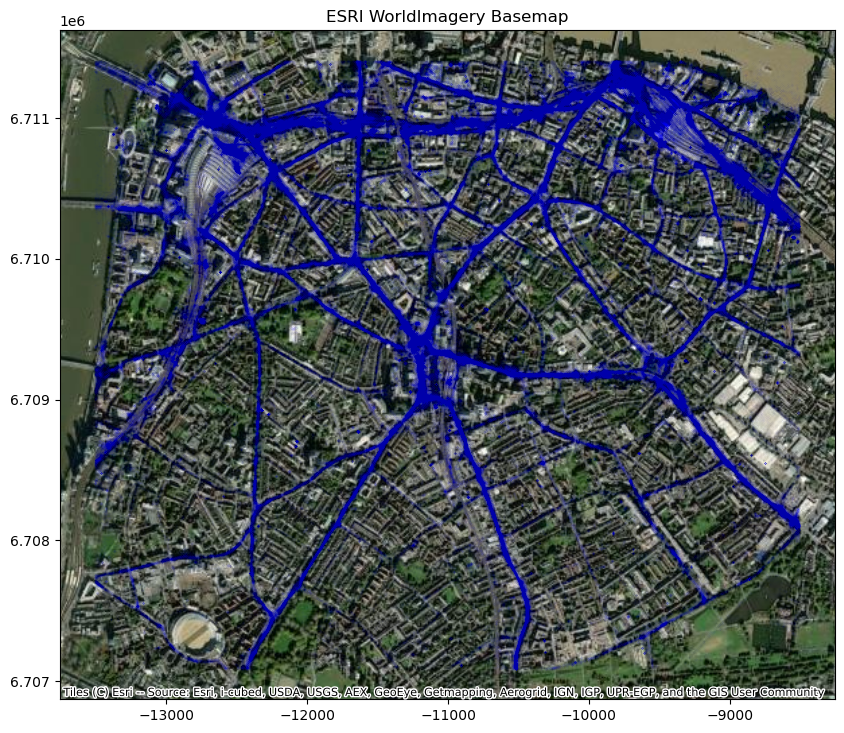

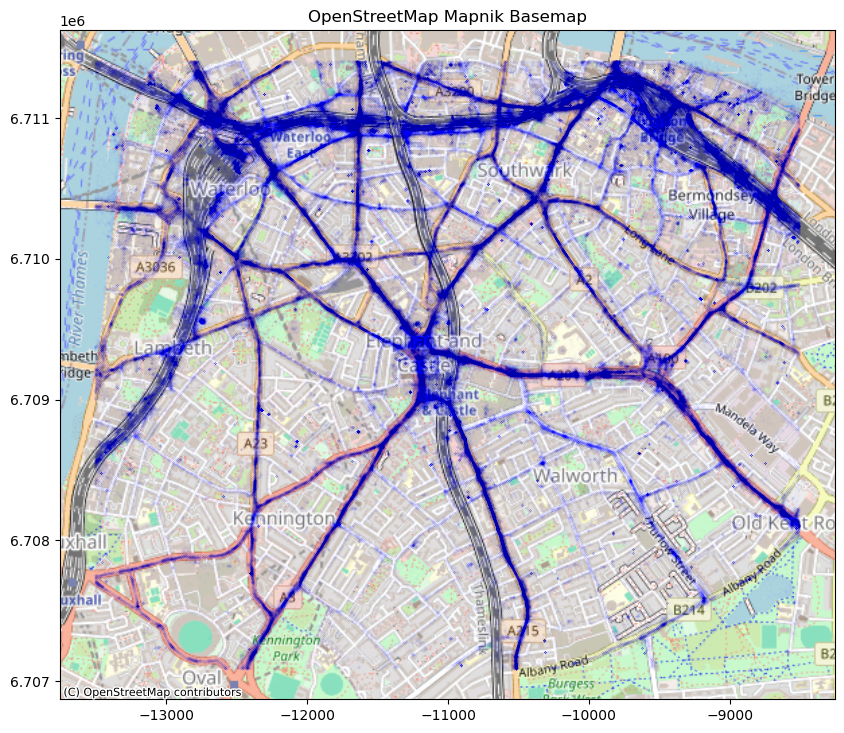

In [86]:
gdf = gpd.GeoDataFrame(
    df1, geometry=gpd.points_from_xy(df1.lon, df1.lat))

gdf = gdf.set_crs(epsg=4326)
gdf = gdf.to_crs(epsg=3857)
fig, ax1 = plt.subplots(1, figsize=(10, 10))
gdf.plot(ax=ax1, markersize=0.0001,color='blue')
cx.add_basemap(ax1, crs=gdf.crs.to_string(), source=cx.providers.Esri.WorldImagery)
ax1.set_title("ESRI WorldImagery Basemap")

fig, ax2 = plt.subplots(1, figsize=(10, 10))
gdf.plot(ax=ax2, markersize=0.0001,color='blue')
cx.add_basemap(ax2, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax2.set_title("OpenStreetMap Mapnik Basemap")

- Following that, I created a `ShowTrack` function that can reflect the daily movement trajectory of a specific user. This is helpful for further analysis of their life patterns and stopping points.
- It's important to note that this trajectory only represents the change in movement direction and orientation, and cannot accurately express the user's actual movement path.

In [87]:
def Track(x):
  df_user = df1[df1['user_n'] == x]
  df_user = df_user.sort_values(by='datetime')
  gdf = gpd.GeoDataFrame(
    df_user, geometry=gpd.points_from_xy(df_user.lon, df_user.lat))
  gdf = gdf.set_crs(epsg=4326)
  gdf = gdf.to_crs(epsg=3857)
    
  unique_days = gdf['DD'].unique()
  cmap = plt.cm.get_cmap('viridis', len(unique_days))  
    
    
#create the individual trace map based on ESRI WorldImagery Basemap
  fig, ax1 = plt.subplots(1, figsize=(10, 10))
  for i, day in enumerate(sorted(unique_days)):
        day_gdf = gdf[gdf['DD'] == day]
        color = cmap(i)
        day_gdf.plot(ax=ax1, markersize=30, color=color) 
        if len(day_gdf) > 1:
            ax1.plot(day_gdf.geometry.x, day_gdf.geometry.y, color=color, linewidth=2)
  cx.add_basemap(ax1, crs=gdf.crs.to_string(), source=cx.providers.Esri.WorldImagery)
  ax1.set_title("ESRI WorldImagery Basemap")
    
#create the individual trace map based on OpenStreetMap Mapnik Basemap
  fig, ax2 = plt.subplots(1, figsize=(10, 10))
  for i, day in enumerate(sorted(unique_days)):
        day_gdf = gdf[gdf['DD'] == day]
        color = cmap(i)
        day_gdf.plot(ax=ax2, markersize=30, color=color)
        if len(day_gdf) > 1:
            ax2.plot(day_gdf.geometry.x, day_gdf.geometry.y, color=color, linewidth=2)
  cx.add_basemap(ax2, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
  ax2.set_title("OpenStreetMap Mapnik Basemap")

def track(x):
    df_user = df1[df1['user_n'] == x].copy()
    df_user = df_user.sort_values(by='datetime')
    gdf = gpd.GeoDataFrame(
        df_user, geometry=gpd.points_from_xy(df_user.lon, df_user.lat))

    gdf = gdf.set_crs(epsg=4326)
    gdf = gdf.to_crs(epsg=3857)

    unique_days = gdf['DD'].unique()
    
    for day in unique_days:
        day_gdf = gdf[gdf['DD'] == day]
        num_points = len(day_gdf)
        if num_points > 1:  
            fig, ax = plt.subplots(1, figsize=(10, 10))
            day_gdf.plot(ax=ax, markersize=30, color='red')
            
            cmap = plt.cm.get_cmap('Reds', num_points)
            for i in range(num_points - 1):
                start, end = day_gdf.geometry.iloc[i], day_gdf.geometry.iloc[i + 1]
                color = cmap(i)
                ax.annotate("", xy=(end.x, end.y), xycoords='data',
                            xytext=(start.x, start.y), textcoords='data',
                            arrowprops=dict(arrowstyle="->", color=color, lw=2))
            specific_date_str = day_gdf['date'].iloc[0]
            specific_date = specific_date_str.strftime('%Y-%m-%d')
            cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
            ax.set_title(f"User {x}'s Movement on {specific_date} (Day {day})")
            

def ShowTrack(x):
    Track(x)
    track(x)

df1['user_n'].unique()

array([    1,     2,     3, ..., 31604, 31605, 31606])

- Here, by entering the user number you want to search for, you can display their specific daily trace information. Here we use user number 10000 as an example.
- (Note: The dataset contains the movement trajectory information of a total of 31,606 users.)

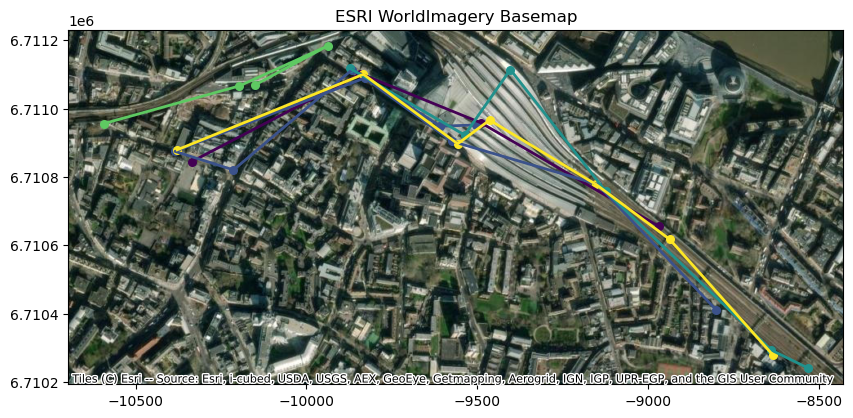

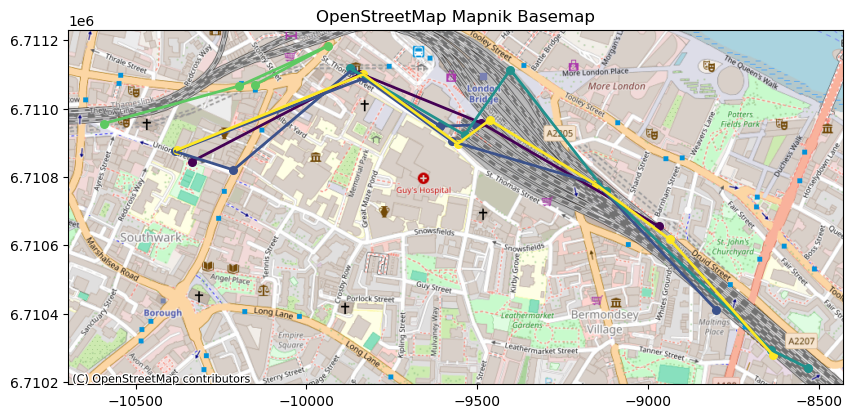

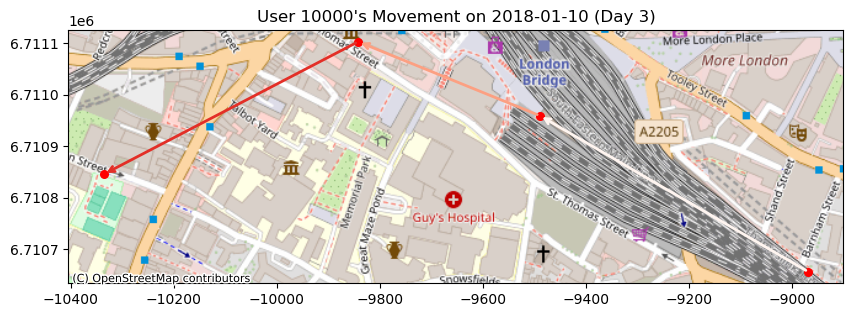

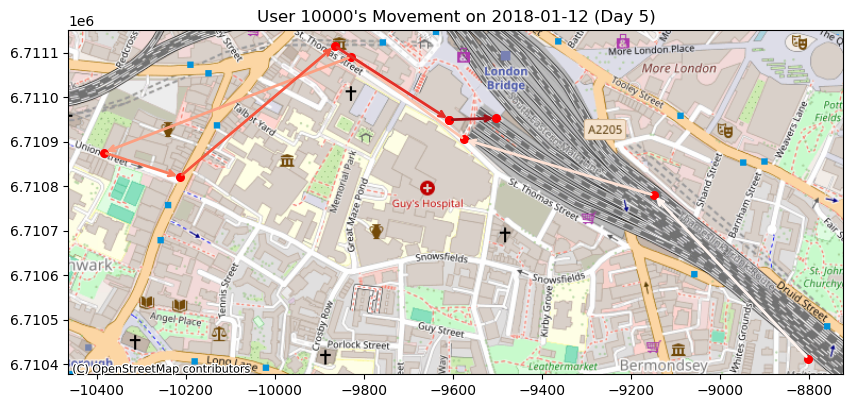

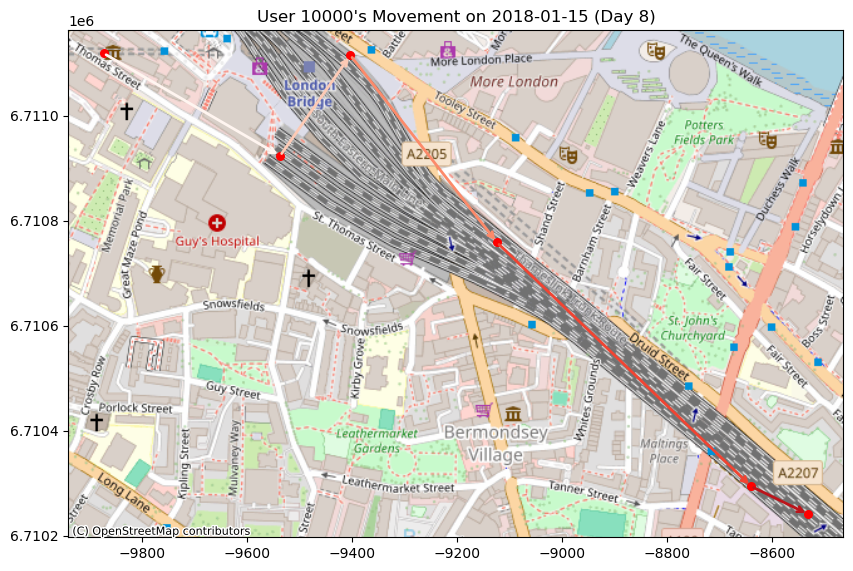

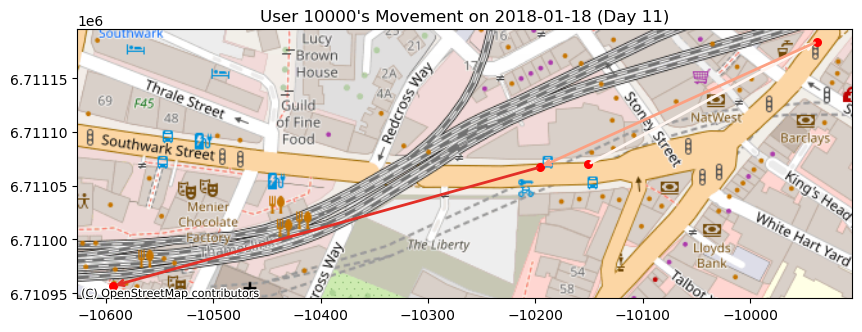

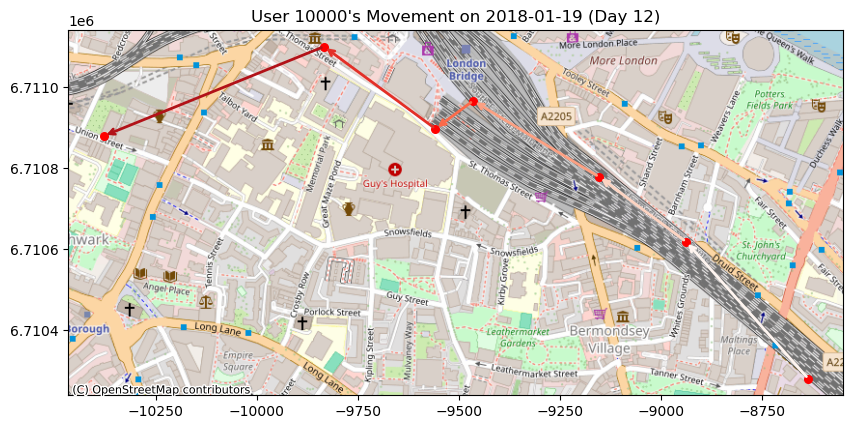

In [88]:
ShowTrack(10000) 

### 3.1 Algorithm To Detect Dwells
- So far, the initial processing of the data has been completed. Next, further processing of the data will be conducted based on real-world factors and the objectives of the analysis.
- Since our main focus is on individual dwells, I will next study dwells, as stopping points. After a literature review, I firstly do defined a dwell.
- In my perspective: if a person moves a distance within a small geographical area that is below a certain threshold, and the stay duration exceeds a set time threshold, then this geographical area can be recognized as a stopping point.
In this study, I set the distance threshold to 200 meters and the time threshold to 30 minutes (i.e., 30*60=1800 seconds).

 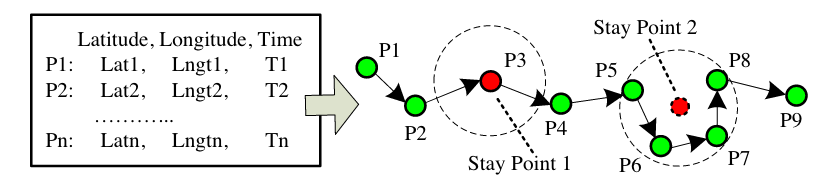

Here is a example: If the user stays at P3 for a time exceeding the threshold, then P3 is defined as a stopping point.
Also, if the user stays for a total time exceeding the threshold during the shorter trips from P5 to P8, this defines the geometric center of this group of points as a new stop point 2.

 ##### Algorithm approach:
- Starting from the first trajectory point pi as the anchor point, find all points going forward that do not exceed the distance threshold distThreh.
- If the total duration of these points exceeds the time threshold timeThreh, they are classified as a stopping point, and the point following the dwell point set is taken as the new anchor point.
Otherwise, move the anchor point one position forward and recall and judge again.

In [89]:
def stay_point_detection_per_user(df, dist_threshold=200, time_threshold=30*60):
    df['datetime'] = pd.to_datetime(df['datetime'], utc=True)
    df = df.sort_values(['user_n', 'datetime'])
    grouped = df.groupby('user_n')
    stay_points = []

    for user_n, group in grouped:
        i = 0
        while i < len(group) - 1:
            j = i + 1
            while j < len(group):
                dist = group.iloc[j]['distance_m']
                if dist <= dist_threshold: 
                    delta_time = (group.iloc[j]['datetime'] - group.iloc[i]['datetime']).total_seconds()
                    if delta_time > time_threshold:
                        stay_point = {
                            'user_n': user_n,
                            'lat': group.iloc[i:j+1]['lat'].mean(),
                            'lon': group.iloc[i:j+1]['lon'].mean(),
                            'arrival_time': group.iloc[i]['datetime'],
                            'leave_time': group.iloc[j]['datetime'],
                            'duration_s': delta_time
                        }
                        stay_points.append(stay_point)
                    i = j
                    break
                if j == i + 1 or dist > dist_threshold:
                    i = j
                    break
                j += 1

    stay_points_df = pd.DataFrame(stay_points)
    return stay_points_df

stay_points_per_user_df = stay_point_detection_per_user(df1)
stay_points_per_user_df.head()

,user_n,lat,lon,arrival_time,leave_time,duration_s
0,1,51.501484,-0.078966,2018-01-10 17:55:44+00:00,2018-01-11 09:17:47+00:00,55323.0
1,1,51.505066,-0.115424,2018-01-18 08:45:21+00:00,2018-01-18 19:53:08+00:00,40067.0
2,3,51.494298,-0.101678,2018-01-15 09:48:55+00:00,2018-01-15 15:55:31+00:00,21996.0
3,3,51.494187,-0.121010,2018-01-19 22:09:18+00:00,2018-01-19 23:36:39+00:00,5241.0
4,4,51.483347,-0.094371,2018-01-08 18:56:00+00:00,2018-01-09 09:27:39+00:00,52299.0


In [90]:
df1.loc[(df1['user_n'] == 10000) & (df1['DD'] == 3 )]

,user_id,datetime,lat,lon,user_n,date,DD,distance_m,time_diff_s,speed_m_s,time_stay_s
566809,50F394A5-37DC-4573-B093-08E5E98C2AFF,2018-01-10 08:29:15+00:00,51.502443,-0.080565,10000,2018-01-10,3,0.000000,0.0,0.000000,224.0
566810,50F394A5-37DC-4573-B093-08E5E98C2AFF,2018-01-10 08:32:59+00:00,51.504138,-0.085247,10000,2018-01-10,3,375.827997,224.0,1.677804,257.0
566811,50F394A5-37DC-4573-B093-08E5E98C2AFF,2018-01-10 08:37:16+00:00,51.504940,-0.088413,10000,2018-01-10,3,237.307838,257.0,0.923377,521.0
566812,50F394A5-37DC-4573-B093-08E5E98C2AFF,2018-01-10 08:45:57+00:00,51.503502,-0.092852,10000,2018-01-10,3,347.263667,521.0,0.666533,171665.0


##### I chose to first conduct a visualization of these data on a map to study the general trends.

Text(0.5, 1.0, 'OpenStreetMap Mapnik Basemap - All stay points ')

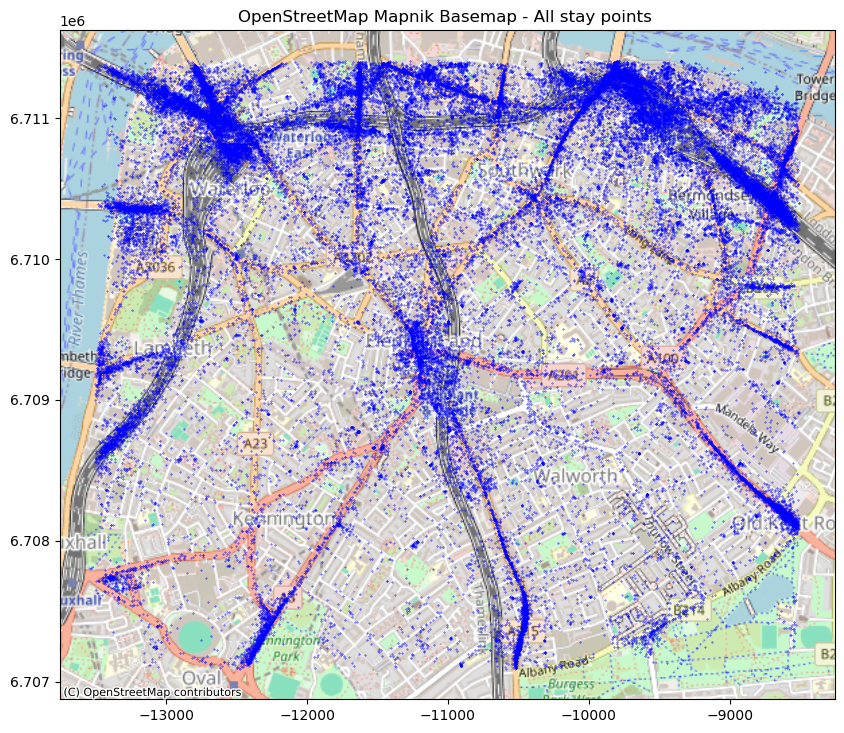

In [91]:
gdf = gpd.GeoDataFrame(
    stay_points_per_user_df, geometry=gpd.points_from_xy(stay_points_per_user_df.lon, stay_points_per_user_df.lat))

gdf = gdf.set_crs(epsg=4326)
gdf = gdf.to_crs(epsg=3857)

fig, ax2 = plt.subplots(1, figsize=(10, 10))
gdf.plot(ax=ax2, markersize=0.1,color='blue')
cx.add_basemap(ax2, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax2.set_title("OpenStreetMap Mapnik Basemap - All stay points ")

### 3.2.1 Home Point Detect 
First, I want to analyze the home (residences) of individuals.
- The rationale behind this is that I can first filter out all the points where users move less than 200 meters between 17:00 in the evening and 9:30 in the morning, meaning the user did not move more than 200m during this time. This can easily be interpreted as the location being the user's residence. After such points are filtered or the geographic geometric center is calculated, it ensures maximum accuracy.

In [92]:
stay_points_per_user_df['arrival_time'] = pd.to_datetime(stay_points_per_user_df['arrival_time'])
stay_points_per_user_df['leave_time'] = pd.to_datetime(stay_points_per_user_df['leave_time'])

def is_home(arrival_time, leave_time):
    if arrival_time.hour >= 17 and leave_time.hour < 9.30:
        return 1
    else:
        return 0

stay_points_per_user_df['home'] = stay_points_per_user_df.apply(lambda row: is_home(row['arrival_time'], row['leave_time']), axis=1)
stay_points_per_user_df[stay_points_per_user_df['home']==1].head

<bound method NDFrame.head of        user_n        lat       lon              arrival_time  \
0           1  51.501484 -0.078966 2018-01-10 17:55:44+00:00   
4           4  51.483347 -0.094371 2018-01-08 18:56:00+00:00   
6           4  51.484600 -0.094034 2018-01-09 23:02:28+00:00   
7           4  51.483185 -0.094412 2018-01-11 18:34:41+00:00   
11          4  51.483253 -0.094358 2018-01-18 23:57:20+00:00   
...       ...        ...       ...                       ...   
59319   31598  51.484279 -0.093972 2018-01-10 18:12:37+00:00   
59323   31600  51.483677 -0.110948 2018-01-17 19:40:28+00:00   
59333   31605  51.483188 -0.111802 2018-01-08 18:50:26+00:00   
59335   31605  51.485144 -0.110737 2018-01-10 18:50:05+00:00   
59339   31605  51.484302 -0.085733 2018-01-17 19:22:21+00:00   

                     leave_time  duration_s  home  
0     2018-01-11 09:17:47+00:00     55323.0     1  
4     2018-01-09 09:27:39+00:00     52299.0     1  
6     2018-01-10 07:44:52+00:00     31344.0  

### 3.2.2 Check Unique Home Point
We assume here that a user will only have one home address. Therefore, when a user has multiple potential home locations, I will first make a judgment, based on the following principle:

For a user with multiple home indicators, compare different home positions through latitude and longitude coordinates. If the distance between different homes exceeds 500 meters, then delete that data;
If the distance between them does not exceed 500 meters, then calculate the geographic geometric center using the above method.

The advantage of this approach is that it ensures data non-redundancy and reliability, eliminating the possibility of misjudging the home address. The downside is that it might overlook some potential home locations.

In [93]:
home_points_df = stay_points_per_user_df[stay_points_per_user_df['home'] == 1]
unique_homes = []

for user_n, group in home_points_df.groupby('user_n'):
    if len(group) == 1:
        unique_homes.append({
            'user_n': user_n,
            'mean_lat': group.iloc[0]['lat'],
            'mean_lon': group.iloc[0]['lon']
        })
    else:
        for i, point_i in group.iterrows():
            close_points = [point_i]
            for j, point_j in group.iterrows():
                if i != j and geodesic((point_i['lat'], point_i['lon']), (point_j['lat'], point_j['lon'])).meters <= 500:
                    close_points.append(point_j)
            if len(close_points) > 1:
                avg_lat = pd.DataFrame(close_points)['lat'].mean()
                avg_lon = pd.DataFrame(close_points)['lon'].mean()
                unique_homes.append({
                    'user_n': user_n,
                    'mean_lat': avg_lat,
                    'mean_lon': avg_lon
                })
                break

unique_home_df = pd.DataFrame(unique_homes)
unique_home_df.head

<bound method NDFrame.head of       user_n   mean_lat  mean_lon
0          1  51.501484 -0.078966
1          4  51.483596 -0.094294
2          7  51.482617 -0.094495
3         15  51.502417 -0.077462
4         21  51.505826 -0.086517
...      ...        ...       ...
7307   31592  51.495144 -0.100230
7308   31597  51.502315 -0.080917
7309   31598  51.483759 -0.094215
7310   31600  51.483677 -0.110948
7311   31605  51.484166 -0.111270

[7312 rows x 3 columns]>

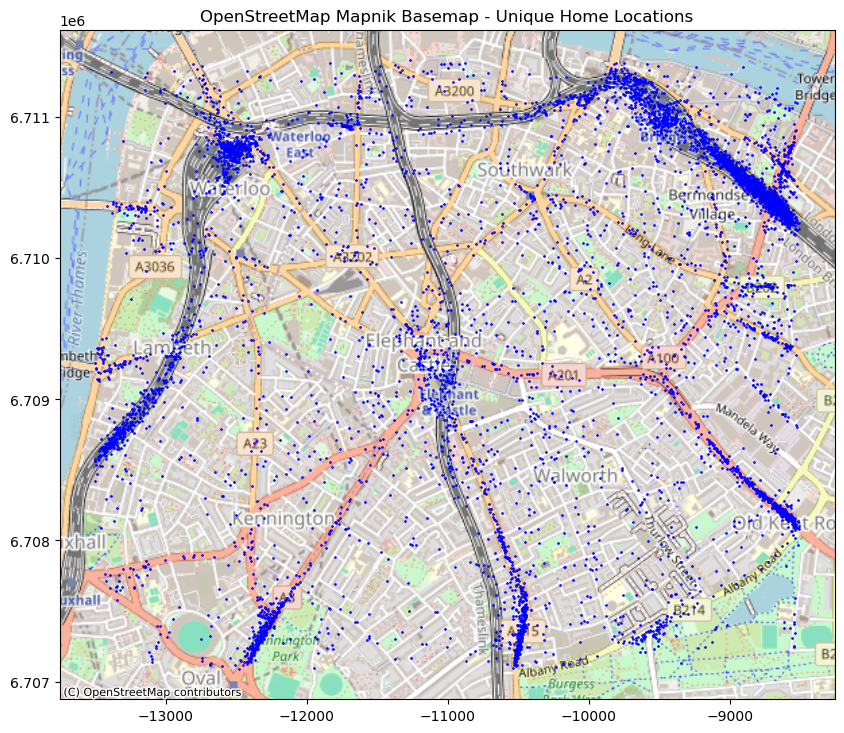

In [94]:
gdf_unique_home = gpd.GeoDataFrame(unique_home_df, geometry=gpd.points_from_xy(unique_home_df.mean_lon, unique_home_df.mean_lat))
gdf_unique_home = gdf_unique_home.set_crs(epsg=4326)
gdf_unique_home = gdf_unique_home.to_crs(epsg=3857)

fig, ax = plt.subplots(1, figsize=(10, 10))
gdf_unique_home.plot(ax=ax, markersize=0.8, color='blue')
cx.add_basemap(ax, crs=gdf_unique_home.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title("OpenStreetMap Mapnik Basemap - Unique Home Locations")
plt.show()

### 3.2.2 Result Analysiz
Up to now, we have identified all the potential residences of users in the dataset, but my colleague has noticed a problem. For the map of Unique Home Locations, there are some clusters located at major stations, such as Waterloo Station and London Bridge Station. There are also clusters at the edges of the map, such as the railway south of Lambeth and the highway south of Kennington Park.

I believe this does not imply that there are a large number of residences at these locations. Instead, I think this is due to the limitations and boundaries of the map size. For example, there might be a user who takes a train from Waterloo Station after 18:00 to an area outside the shown map, and the last detectable point would be Waterloo Station. The next morning before 09:00, this user might arrive at Waterloo Station from an area outside the map.

According to my algorithm, Waterloo Station would be defined as this user's home point, which in reality, only represents two significant points in the study area and does not imply the station is their home. The same applies to other clusters. Therefore, when studying user residences, I believe it is necessary to further obtain station information from platforms such as Transport for London or OpenStreetMap, to further study the points within these clusters and obtain more accurate home point information.

### 3.2.1 Workspace Points Detect 
Next, I want to study the workplaces of users.

The first point I want to mention is that, considering that the working days for most people are from Monday to Friday, it is possible to further filter those stay points that only appear on weekdays (Monday to Friday). 

This helps to eliminate points of recreational activities during weekends. However, since the data in this dataset were all generated on weekdays, there is no need for pre-processing in this regard.

### 3.2.1 Situations and Methods 

Determining workplaces can be a bit more complex than detecting residences due to the variety of work patterns. Considering the real-world scenarios, I will use two methods to detect users' workplaces.

The first method is to set a threshold for work hours. For workplaces, I define stay points that have an arrival time between 8:00 AM and 9:30 AM, and a departure time between 5:00 PM and 7:00 PM as potential work points. These time periods roughly reflect the typical commute times.

The second method is to analyze the duration of stay. A characteristic of workplaces usually includes staying for an extended period during the daytime on workdays. Therefore, I will set stay points that have a duration exceeding a certain threshold (for example, at least 6 hours) during the day (8:00 AM to 4:00 PM) as potential work points.

- The first method, determining the threshold for work hours:

- For workplaces, I set the arrival time between 8:00 and 9:30 in the morning and the departure time between 16:30 and 18:30 in the afternoon as potential work points. These time intervals roughly reflect regular commuting hours.

In [95]:
stay_points_per_user_df['arrival_time'] = pd.to_datetime(stay_points_per_user_df['arrival_time'])
stay_points_per_user_df['leave_time'] = pd.to_datetime(stay_points_per_user_df['leave_time'])

def is_workspace(arrival_time, leave_time):
    if 9.30 >= arrival_time.hour >= 8.00 and 19.00>=leave_time.hour >= 17.00:
        return 1
    else:
        return 0

stay_points_per_user_df['workspace'] = stay_points_per_user_df.apply(lambda row: is_workspace(row['arrival_time'], row['leave_time']), axis=1)
stay_points_per_user_df[stay_points_per_user_df['workspace']==1].head()

,user_n,lat,lon,arrival_time,leave_time,duration_s,home,workspace
1,1,51.505066,-0.115424,2018-01-18 08:45:21+00:00,2018-01-18 19:53:08+00:00,40067.0,0,1
9,4,51.500781,-0.119447,2018-01-15 09:57:47+00:00,2018-01-15 18:21:29+00:00,30222.0,0,1
25,11,51.505115,-0.081782,2018-01-17 09:15:48+00:00,2018-01-17 17:37:15+00:00,30087.0,0,1
46,22,51.503766,-0.093658,2018-01-12 09:51:22+00:00,2018-01-12 17:06:18+00:00,26096.0,0,1
49,28,51.499846,-0.114670,2018-01-16 09:12:55+00:00,2018-01-16 19:13:48+00:00,36053.0,0,1


In [96]:
workspace_points_df = stay_points_per_user_df[stay_points_per_user_df['workspace'] == 1]
len(workspace_points_df['user_n'].unique()) == len(workspace_points_df['workspace'])
stay_points_per_user_df[(stay_points_per_user_df['workspace'] == 1) & (stay_points_per_user_df['home'] == 1)]

,user_n,lat,lon,arrival_time,leave_time,duration_s,home,workspace


- Then, I attempted to explore the workspaces using the second method, which involves analyzing stay durations:
Workplaces typically involve longer stays during daytime hours on workdays.
- Therefore, I set stay points with durations exceeding a certain threshold (for example, 6 hours) during the daytime (8:00 to 16:00) as potential work points.

In [97]:
def is_workplace_2(row):
    if row['workspace'] == 1:
        return 1
    if row['arrival_time'].date() != row['leave_time'].date():
        return 0

    work_start_time = pd.Timestamp(row['arrival_time']).replace(hour=8, minute=0, second=0, microsecond=0)
    work_end_time = pd.Timestamp(row['arrival_time']).replace(hour=16, minute=30, second=0, microsecond=0)
    
    arrival_time = max(row['arrival_time'], work_start_time)
    leave_time = min(row['leave_time'], work_end_time)
    
    stay_duration_seconds = (leave_time - arrival_time).total_seconds()
    stay_duration_hours = stay_duration_seconds / 3600
    
# Check if the stay duration exceeds 6 hours
    if 0 < stay_duration_hours >= 6:
        return 1
    else:
        return 0


stay_points_per_user_df['workspace'] = stay_points_per_user_df.apply(is_workplace_2 , axis=1)
stay_points_per_user_df[stay_points_per_user_df['workspace']==1]

,user_n,lat,lon,arrival_time,leave_time,duration_s,home,workspace
1,1,51.505066,-0.115424,2018-01-18 08:45:21+00:00,2018-01-18 19:53:08+00:00,40067.0,0,1
2,3,51.494298,-0.101678,2018-01-15 09:48:55+00:00,2018-01-15 15:55:31+00:00,21996.0,0,1
5,4,51.500721,-0.117844,2018-01-09 09:44:42+00:00,2018-01-09 22:50:59+00:00,47177.0,0,1
8,4,51.500841,-0.118776,2018-01-12 07:41:44+00:00,2018-01-12 19:40:26+00:00,43122.0,0,1
9,4,51.500781,-0.119447,2018-01-15 09:57:47+00:00,2018-01-15 18:21:29+00:00,30222.0,0,1
...,...,...,...,...,...,...,...,...
59322,31600,51.504383,-0.095638,2018-01-17 08:03:18+00:00,2018-01-17 19:31:49+00:00,41311.0,0,1
59334,31605,51.502491,-0.119872,2018-01-10 07:23:43+00:00,2018-01-10 18:22:56+00:00,39553.0,0,1
59336,31605,51.500798,-0.118771,2018-01-11 07:20:50+00:00,2018-01-11 18:41:52+00:00,40862.0,0,1
59338,31605,51.501270,-0.119562,2018-01-17 07:21:40+00:00,2018-01-17 18:59:15+00:00,41855.0,0,1


### 3.3.2 Check Unique Workspace Points
Using a similar algorithm, identify unique workspace points.

In [98]:
workspace_points_df = stay_points_per_user_df[stay_points_per_user_df['workspace'] == 1]
unique_workspaces = []

for user_n, group in workspace_points_df.groupby('user_n'):
    if len(group) == 1:
        unique_workspaces.append({
            'user_n': user_n,
            'mean_lat': group.iloc[0]['lat'],
            'mean_lon': group.iloc[0]['lon']
        })
    else:
        for i, point_i in group.iterrows():
            close_points = [point_i]
            for j, point_j in group.iterrows():
                if i != j and geodesic((point_i['lat'], point_i['lon']), (point_j['lat'], point_j['lon'])).meters <= 500:
                    close_points.append(point_j)
            if len(close_points) > 1:
                avg_lat = pd.DataFrame(close_points)['lat'].mean()
                avg_lon = pd.DataFrame(close_points)['lon'].mean()
                unique_homes.append({
                    'user_n': user_n,
                    'mean_lat': avg_lat,
                    'mean_lon': avg_lon
                })
                break

unique_workspace_df = pd.DataFrame(unique_workspaces)
unique_workspace_df

,user_n,mean_lat,mean_lon
0,1,51.505066,-0.115424
1,3,51.494298,-0.101678
2,5,51.504076,-0.108220
3,7,51.505180,-0.114149
4,10,51.506234,-0.091564
...,...,...,...
5990,31587,51.492759,-0.097261
5991,31590,51.499397,-0.081180
5992,31597,51.504623,-0.115068
5993,31600,51.504383,-0.095638


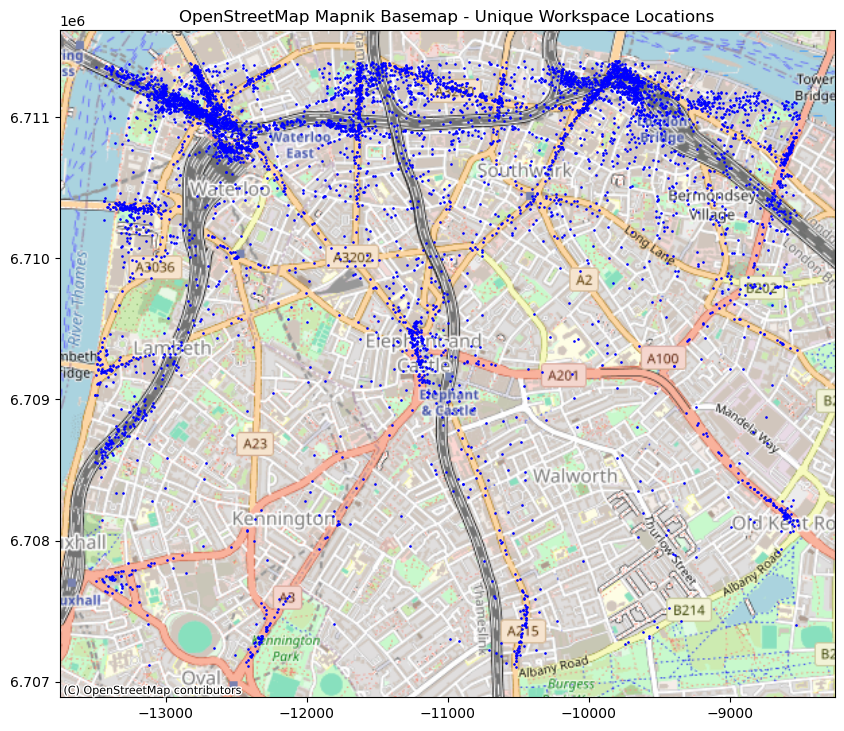

In [99]:
gdf_unique_workspace = gpd.GeoDataFrame(unique_workspace_df, geometry=gpd.points_from_xy(unique_workspace_df.mean_lon, unique_workspace_df.mean_lat))
gdf_unique_workspace = gdf_unique_workspace.set_crs(epsg=4326)
gdf_unique_workspace = gdf_unique_workspace.to_crs(epsg=3857)

fig, ax = plt.subplots(1, figsize=(10, 10))
gdf_unique_workspace.plot(ax=ax, markersize=0.8, color='blue')
cx.add_basemap(ax, crs=gdf_unique_home.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title("OpenStreetMap Mapnik Basemap - Unique Workspace Locations")
plt.show()

In [100]:
unique_home_df.head

<bound method NDFrame.head of       user_n   mean_lat  mean_lon
0          1  51.501484 -0.078966
1          4  51.483596 -0.094294
2          7  51.482617 -0.094495
3         15  51.502417 -0.077462
4         21  51.505826 -0.086517
...      ...        ...       ...
7307   31592  51.495144 -0.100230
7308   31597  51.502315 -0.080917
7309   31598  51.483759 -0.094215
7310   31600  51.483677 -0.110948
7311   31605  51.484166 -0.111270

[7312 rows x 3 columns]>

In [101]:
unique_workspace_df.head

<bound method NDFrame.head of       user_n   mean_lat  mean_lon
0          1  51.505066 -0.115424
1          3  51.494298 -0.101678
2          5  51.504076 -0.108220
3          7  51.505180 -0.114149
4         10  51.506234 -0.091564
...      ...        ...       ...
5990   31587  51.492759 -0.097261
5991   31590  51.499397 -0.081180
5992   31597  51.504623 -0.115068
5993   31600  51.504383 -0.095638
5994   31606  51.504595 -0.115441

[5995 rows x 3 columns]>

Here, I thought that if both the home location and workspace are determined for a `user_n`, it would be useful to combine the two for analysis. 

I believe the first step is to merge the data for both into one data frame.

In [102]:
unique_home_df = unique_home_df.rename(columns={'mean_lat': 'mean_lat_home', 'mean_lon': 'mean_lon_home'})
unique_workspace_df = unique_workspace_df.rename(columns={'mean_lat': 'mean_lat_workspace', 'mean_lon': 'mean_lon_workspace'})
combined_df = pd.merge(unique_home_df, unique_workspace_df, on='user_n', how='inner')
combined_df
def calculate_distance(row):
    home = (row['mean_lat_home'], row['mean_lon_home'])
    workspace = (row['mean_lat_workspace'], row['mean_lon_workspace'])
    return geodesic(home, workspace).meters
combined_df['distance_m'] = combined_df.apply(calculate_distance, axis=1)
combined_df.head(5)

,user_n,mean_lat_home,mean_lon_home,mean_lat_workspace,mean_lon_workspace,distance_m
0,1,51.501484,-0.078966,51.505066,-0.115424,2562.644017
1,7,51.482617,-0.094495,51.505180,-0.114149,2857.478665
2,48,51.500879,-0.078380,51.505090,-0.087182,770.039407
3,56,51.501093,-0.078653,51.505461,-0.091762,1031.919930
4,59,51.494881,-0.084431,51.498824,-0.112295,1984.110424


Next, visualize the combined data on the map. Since the study area is limited and roughly covers two administrative wards in London, I will use wards as the spatial unit. I will add some partition boundaries to the study area.

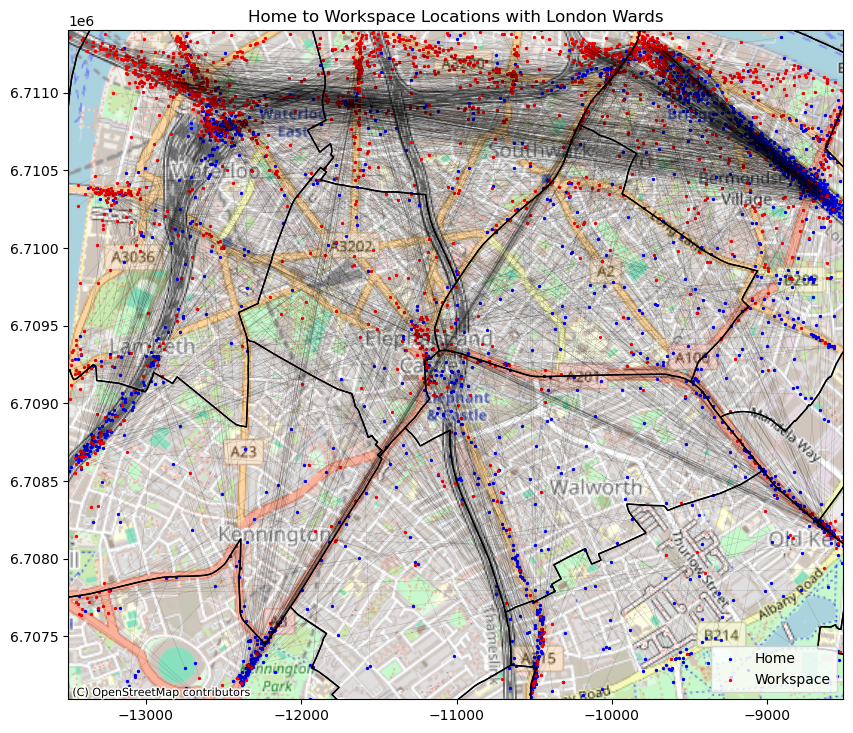

In [103]:
gdf_home = gpd.GeoDataFrame(combined_df,geometry=[Point(xy) for xy in zip(combined_df.mean_lon_home, combined_df.mean_lat_home)],
                            crs="EPSG:4326").to_crs(epsg=3857) 
gdf_workspace = gpd.GeoDataFrame(combined_df,geometry=[Point(xy) for xy in zip(combined_df.mean_lon_workspace, combined_df.mean_lat_workspace)],
                                 crs="EPSG:4326").to_crs(epsg=3857)
gdf_wards = gpd.read_file("London_Ward.shp").to_crs(epsg=3857) 

total_bounds = pd.concat([gdf_home, gdf_workspace]).total_bounds
margin = 0.01  

minx, miny, maxx, maxy = total_bounds
minx -= margin
miny -= margin
maxx += margin
maxy += margin

gdf_home = gdf_home.to_crs(epsg=3857)
gdf_workspace = gdf_workspace.to_crs(epsg=3857)
gdf_wards = gpd.read_file("London_Ward.shp").to_crs(epsg=3857)

fig, ax = plt.subplots(1, figsize=(10, 10))
gdf_home.plot(ax=ax, markersize=2, color='blue', label='Home')
gdf_workspace.plot(ax=ax, markersize=2, color='red', label='Workspace')

gdf_wards.boundary.plot(ax=ax, linewidth=1, edgecolor='black')

for idx, row in combined_df.iterrows():
    line = LineString([(row['mean_lon_home'], row['mean_lat_home']), (row['mean_lon_workspace'], row['mean_lat_workspace'])])
    gdf_line = gpd.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[line]).to_crs(epsg=3857)
    gdf_line.plot(ax=ax, linewidth=0.2, color='black', alpha=0.3)

ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
cx.add_basemap(ax, crs=gdf_home.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax.legend()
ax.set_title("Home to Workspace Locations with London Wards")

plt.show()

### 3.4 Analysis of Commuting Patterns

The map reflects the basic commuting information of users in the dataset. However, as mentioned earlier, most homes and workspaces are clustered around major stations. Additionally, there is a noticeable characteristic: workspaces are mostly clustered along the River Thames, while homes are scattered around Elephant and Castle, spreading outward. More are distributed in the inner and eastern/southern areas.

This demonstrates two residential and work characteristics:

1. **Residential Distribution**: When considering data within boundaries, residents tend to live in inland areas rather than along the River Thames. This is understandable as properties along the Thames are typically more expensive due to better living environments and transportation accessibility. Therefore, residents tend to live in the Elephant and Castle area and spread outward.

2. **Commuting Routes**: When considering data beyond boundaries, many home points are clustered around Waterloo and London Bridge stations. This indicates that these two locations are key transit points for most residents when commuting home. This information is valuable for studying commuting patterns and real-time traffic flow.

3. **Workspace Distribution**: Similarly, considering that most workspaces are clustered in the northern part of the study area, south of the River Thames, there are several possibilities. Firstly, more job opportunities may be concentrated near Waterloo, Southwark, and London Bridge, as these areas are more modern and located in major business districts with more opportunities. Secondly, when considering data beyond boundaries, it's possible that most people's workplaces are north of the River Thames, and their daily commute requires crossing the river, leading to the misinterpretation of data.

   For example, roads and subway lines leading to Blackfriars and Southwark Bridge indicate potential workspaces. It's possible that many people's workplaces are located across the river in the City of London, one of the world's leading financial centers and the main central business district of London. Further accurate confirmation and detection of individual workspaces and homes would require enlarging the study area or enhancing accuracy through further algorithms. This is why I chose wards as boundaries. In future research, I will consider using wards as research units and combine them with census information to discuss the accuracy of dwellings regarding homes or workspaces.

These observations highlight the complexities of commuting patterns and the importance of accurate data analysis for understanding urban mobility.

### 3.5 Other Undefined Stay Points

Since I initially defined stay points with a distance threshold of 200 meters and a time threshold of 30 minutes, in this step, I want to study the remaining information points that were not defined as home or workspace. I will first create a new data frame containing all stay points that were not defined as home or workspace.

In [104]:
stay_points_per_user_df[stay_points_per_user_df['user_n']==4]

,user_n,lat,lon,arrival_time,leave_time,duration_s,home,workspace
4,4,51.483347,-0.094371,2018-01-08 18:56:00+00:00,2018-01-09 09:27:39+00:00,52299.0,1,0
5,4,51.500721,-0.117844,2018-01-09 09:44:42+00:00,2018-01-09 22:50:59+00:00,47177.0,0,1
6,4,51.484600,-0.094034,2018-01-09 23:02:28+00:00,2018-01-10 07:44:52+00:00,31344.0,1,0
7,4,51.483185,-0.094412,2018-01-11 18:34:41+00:00,2018-01-12 07:26:24+00:00,46303.0,1,0
8,4,51.500841,-0.118776,2018-01-12 07:41:44+00:00,2018-01-12 19:40:26+00:00,43122.0,0,1
9,4,51.500781,-0.119447,2018-01-15 09:57:47+00:00,2018-01-15 18:21:29+00:00,30222.0,0,1
10,4,51.500580,-0.119594,2018-01-17 07:55:04+00:00,2018-01-17 17:43:25+00:00,35301.0,0,1
11,4,51.483253,-0.094358,2018-01-18 23:57:20+00:00,2018-01-19 09:45:46+00:00,35306.0,1,0
12,4,51.500844,-0.119350,2018-01-19 10:01:31+00:00,2018-01-19 19:14:03+00:00,33152.0,0,1


In [105]:
stay_points_per_user_df
other_stay_points = stay_points_per_user_df[stay_points_per_user_df['home']==0]
other_stay_points = other_stay_points[other_stay_points['workspace'] == 0]
other_stay_points.head(5)

,user_n,lat,lon,arrival_time,leave_time,duration_s,home,workspace
3,3,51.494187,-0.121010,2018-01-19 22:09:18+00:00,2018-01-19 23:36:39+00:00,5241.0,0,0
14,6,51.487637,-0.111225,2018-01-12 11:26:41+00:00,2018-01-17 13:41:41+00:00,440100.0,0,0
15,6,51.487651,-0.111181,2018-01-17 23:29:28+00:00,2018-01-18 12:40:41+00:00,47473.0,0,0
16,6,51.487653,-0.111226,2018-01-18 13:57:06+00:00,2018-01-18 14:27:10+00:00,1804.0,0,0
19,7,51.484618,-0.093929,2018-01-18 16:53:54+00:00,2018-01-19 08:34:21+00:00,56427.0,0,0


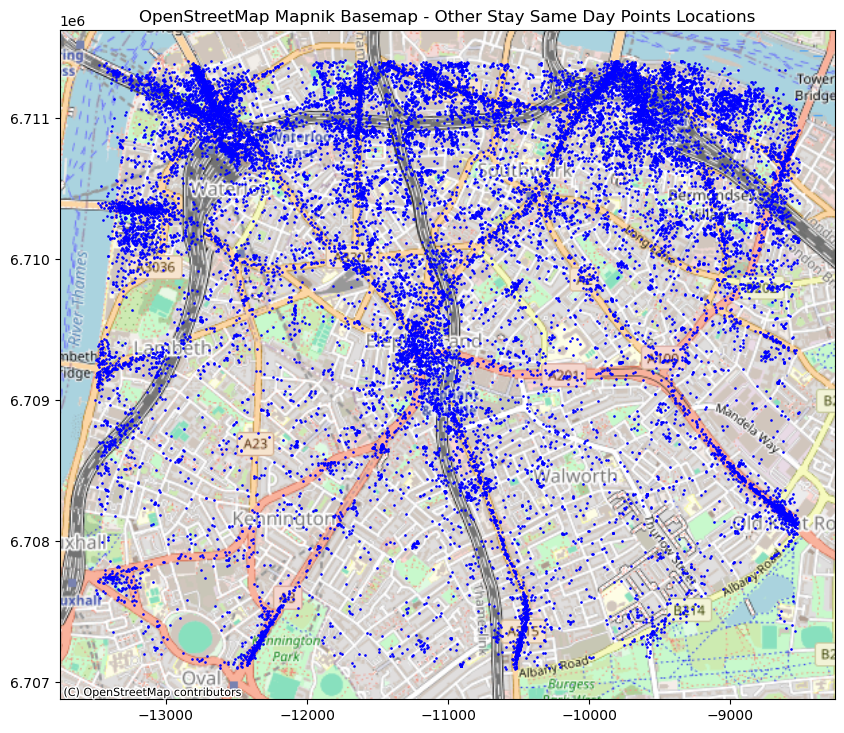

In [106]:
gdf_other_stay_points = gpd.GeoDataFrame(other_stay_points, geometry=gpd.points_from_xy(other_stay_points.lon, other_stay_points.lat))
gdf_other_stay_points = gdf_other_stay_points.set_crs(epsg=4326)
gdf_other_stay_points = gdf_other_stay_points.to_crs(epsg=3857)
gdf_other_same_day_stay_points = gdf_other_stay_points[gdf_other_stay_points['arrival_time'].dt.date == gdf_other_stay_points['leave_time'].dt.date]

fig, ax = plt.subplots(1, figsize=(10, 10))
gdf_other_same_day_stay_points.plot(ax=ax, markersize=0.8, color='blue')
cx.add_basemap(ax, crs=gdf_other_same_day_stay_points.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title("OpenStreetMap Mapnik Basemap - Other Stay Same Day Points Locations")
plt.show()

At this stage, I have identified all stay points that were not defined as home or workspace. Through my filtering, these points have been processed, and now the data in the `gdf_other_same_day_stay_points` dataframe consists of potential dwells of different users within a single day. I am prepared to conduct further research in the future. 

The preliminary research method is similar to the previous one, which involves setting time thresholds and constraints to identify potential points where events may occur. For example, stay points between 11:30 AM and 2:30 PM are likely to be lunch restaurants for the respective users.

## 4.1 Further Thoughts

#### Then I would like to add some further thoughts on completing this project for the future.

#### First, regarding the data provided by this assessment, I believe it has certain characteristics:

#### Advantages:
1. The data is very clear. Different latitude and longitude coordinates, as well as time, can accurately locate each user's activity information, and based on this, explore users' daily activities and dwells. It also has great potential for research in specific fields.
2. Compared to Mobile Phone Network Data, as GPS data, it is more precise in locating specific user positions, rather than basing locations on signal towers (base staions), which only allows for the study of regional data.
#### Disadvantages:
1. The range of use of this data happens to cover several major stations at the edge of the area. The massive flow of people, especially those frequently entering and leaving the research area, can affect the quality of the results, causing some dwells to be misjudged.
2. Most of the data lacks continuity. If the data could progress in minutes, it would provide more reliable support for the research. Most of the information in this dataset spans a large timeframe, resulting in many data points needing to be discarded.

#### Next, regarding the research topic 'GPS Data Analysis for Individual Dwells', I have some ideas for future research:
1. Further investigate the issue of regional boundaries. I have currently researched reducing the impact of research area boundaries by setting buffer zones. This is something I will continue to consider and improve in future research. I will also try to use machine learning modeling, algorithm adjustments, and other methods to eliminate boundary effects as much as possible.
2. In this assignment, I mainly researched homes and workspaces. However, in fact, there is a large research space for places users frequently visit, such as restaurants, entertainment venues (like cinemas, shopping malls, etc.). Research on homes and workspaces can provide a template for other places, but analyzing other locations will have more complex filtering conditions. Later, I might use methods like location classification (identifying the categories of specific locations through GIS), frequency and pattern recognition (analyzing user habits) to further research.
3. In this task, I used GeoPandas, with which I am more familiar. However, through communication with my course advisor, the MovingPandas toolkit can create more interactive maps, making the analysis results easier to understand. In future projects, I will try to use new toolkits to visualize data and solve problems.
4. Since this is just a preliminary assignment, my definitions of home and workspace were relatively simple. But in reality, there are more complex situations, such as users leaving their phones at home, work from home (which becoming popular after the 2019 pandemic), etc. Depending on the dataset, more factual factors may need to be considered.
5. This dataset is based on the London area. So, in my analysis, I incorporated some of my knowledge of London. For example, the stations I mentioned I have visited, and I understand their passenger flow and operational trajectories. I believe that combining these real-world factors with data analysis can yield the most accurate results.


#### Finally, regarding the 'Estimating Dwells using Mobile Phone Network Data' project provided by GHD and Virgin Media O2, I also have some thoughts:
1. First, I will clarify the direction and purpose of the research. For example, as a media and telecommunications company, Virgin Media O2's business involves more home routers and personal SIM cards. My aforementioned research on home points can be combined with UK census data to find the market share of Virgin Media home routers in different geographic areas, which can have a positive impact on the company's operational strategies.

   Similarly, Mobile Phone Network Data also reflects users' daily travel data. Combined with my ideas about geographical boundaries, researching individuals' signal drifts and signal interruption locations can provide directions for O2 operators.For example, strengthening signal base station facilities where there are large crowds and signals are easily lost, to better serve users. Similarly, GHD can also use this data for consulting departments, serving more customers from architecture, urban planning, and environmental fields.
3. I will research more existing methods and means of estimating dwells and build on this basis. I believe that there are already many mature methods for predicting dwells, and I can also focus on verifying the accuracy of research results and looking for errors and inaccuracies. For example, some machine learning algorithms I have previously applied could be used to train preliminary research results, such as cluster analysis, classification algorithms, and sequence pattern mining. This could identify patterns in user behavior, enhancing the accuracy of the final results.
4. In conducting research, I will also critically consider societal issues. For example, whether the distribution of home points is related to housing price distributions? What influences people's travel patterns? I believe this can lead to a more comprehensive analytical understanding.
   
#### Finally, these are some reflections on the work I've been doing:
At the start of the research, faced with vast amounts of data, I felt somewhat directionless. However, as I delved into the literature, reviewed others' work, and repeatedly created and modified code, I began to see the allure of this data. I was able to present some simple numbers in map form, which brought me an indescribable sense of joy and accomplishment. Through this test work, I've grown more enthusiastic and contemplative about the project 'Estimating Dwells using Mobile Phone Network Data.' Should I take on this project, I believe I could make a meaningful contribution to the field.

#### Thank you for taking the time to read this!

#### Reference list

Badarinza, C. and Ramadorai, T. (2018) ‘Home away from home? Foreign demand and London house prices’, Journal of Financial Economics, 130(3), pp. 532–555. Available at: https://doi.org/10.1016/j.jfineco.2018.07.010.

Census - Office for National Statistics (2019). Available at: https://www.ons.gov.uk/census (Accessed: 5 March 2024).

Li, Q. et al. (2008) ‘Mining user similarity based on location history’, in Proceedings of the 16th ACM SIGSPATIAL international conference on Advances in geographic information systems. New York, NY, USA: Association for Computing Machinery (GIS ’08), pp. 1–10. Available at: https://doi.org/10.1145/1463434.1463477.

Zhou, X. et al. (2021) ‘Workplace segregation of rural migrants in urban China: A case study of Shenzhen using cellphone big data’, Environment and Planning B: Urban Analytics and City Science, 48(1), pp. 25–42. Available at: https://doi.org/10.1177/2399808319846903.